#**Data Exploration**

**Mounting Drive Files**

In [10]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google.colab'

**Extracting Face mask data zipfile to current directory**

In [1]:
from zipfile import ZipFile

# loading the Archive.zip and creating a zip object
with ZipFile("/content/drive/MyDrive/archive.zip", 'r') as zObject:

    # Extracting all the members of the zip to cd
    zObject.extractall(
        path="/content/face_mask_data")

**Extracting Videos zipfile to current directory**

In [2]:
with ZipFile("/content/drive/MyDrive/OneDrive_2024-05-27.zip",'r') as zObject:

  zObject.extractall(path="/content/test_videos")

**Let's first explore the train.csv file**

In [3]:
import pandas as pd
import numpy as np
from google.colab import data_table

#Reading csv file
data = pd.read_csv('/content/face_mask_data/train.csv')

# Viewing dataframe in table format
data_table.enable_dataframe_formatter()
print("Training sample size: ",len(data))
data

Training sample size:  15412


,name,x1,x2,y1,y2,classname
0,2756.png,69,126,294,392,face_with_mask
1,2756.png,505,10,723,283,face_with_mask
2,2756.png,75,252,264,390,mask_colorful
3,2756.png,521,136,711,277,mask_colorful
4,6098.jpg,360,85,728,653,face_no_mask
...,...,...,...,...,...,...
15407,1894.jpg,437,121,907,644,face_with_mask
15408,1894.jpg,557,363,876,636,mask_surgical
15409,1894.jpg,411,3,940,325,hat
15410,3216.png,126,69,409,463,face_with_mask


The above table consists 15412 images. Let's first drop duplicates and check.

In [4]:
data.drop_duplicates(inplace = True)
print("Training sample size after removing duplicates:",len(data))

Training sample size after removing duplicates: 15411


Just one row was duplicate. As there might be multiple detections in an image let's find out how many images are used in training sample & total no. of classes they are classified into.

In [5]:
print("Unique Images: ",len(data.name.unique()))
print("No. of classes: ",len(data.classname.unique()))

Unique Images:  4326
No. of classes:  20


Now let's see the 20 classes.

In [6]:
# Identify different classnames
class_data = data.drop_duplicates(subset = "classname", ignore_index= True)
class_data

,name,x1,x2,y1,y2,classname
0,2756.png,69,126,294,392,face_with_mask
1,2756.png,75,252,264,390,mask_colorful
2,6098.jpg,360,85,728,653,face_no_mask
3,6427.png,218,98,577,580,face_with_mask_incorrect
4,6427.png,278,386,582,582,mask_surgical
5,5392.jpg,261,0,444,257,face_other_covering
6,5392.jpg,261,2,444,257,scarf_bandana
7,4287.png,166,201,592,336,eyeglasses
8,3754.png,354,181,610,337,helmet
9,3754.png,455,257,629,465,face_shield


Let's visualise the 20 classes.

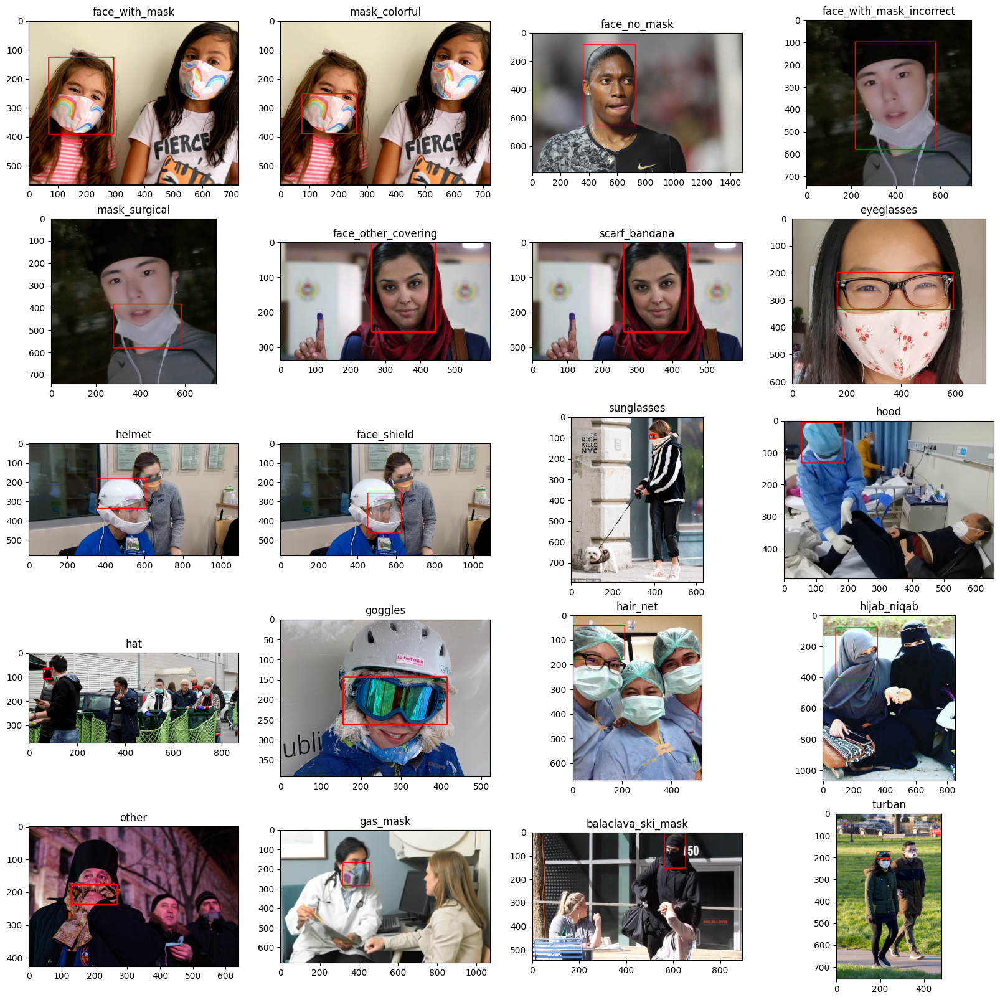

In [7]:
from PIL import Image
import matplotlib.pyplot as plt

# function takes image(numpy array), xyxy format coordinates & returns image with bbox
def draw_bbox(image, top_left_x, top_left_y, bot_right_x, bot_right_y):

  image[top_left_y-2 : top_left_y + 2, top_left_x : bot_right_x] = [255,0,0]
  image[bot_right_y-2 : bot_right_y + 2, top_left_x : bot_right_x] = [255,0,0]

  image[top_left_y : bot_right_y, top_left_x - 2 : top_left_x + 2] = [255,0,0]
  image[top_left_y : bot_right_y, bot_right_x - 2 : bot_right_x + 2] = [255,0,0]

  return image

# Dir where images are stored
dir = "/content/face_mask_data/Medical mask/Medical mask/Medical Mask/images/"

# Plotting the 20 classes
fig,ax = plt.subplots(5,4, figsize = (20,20))
index = 0
for i in range(5):
  for j in range(4):
    row = class_data.iloc[index]
    path = dir + row["name"]
    image = np.array(Image.open(path))
    detect_image = draw_bbox(image, row["x1"], row["x2"], row["y1"], row["y2"])

    ax[i][j].imshow(detect_image)
    ax[i][j].set_title(row["classname"])

    index += 1


# **Preparing Train and Test data**

We need to detect only two classes(face_with_mask, face_no_mask). Let's collect the rows that have these two classes and see how many samples are there for each.

In [8]:
mask_sample = len(data.query('classname == "face_with_mask"'))
no_mask_sample = len(data.query('classname == "face_no_mask"'))
print("mask_samples: ", mask_sample, "& no_mask_samples: ", no_mask_sample)
new_data = data.query('classname == "face_with_mask" or classname == "face_no_mask"')
new_data

mask_samples:  4180 & no_mask_samples:  1568


,name,x1,x2,y1,y2,classname
0,2756.png,69,126,294,392,face_with_mask
1,2756.png,505,10,723,283,face_with_mask
4,6098.jpg,360,85,728,653,face_no_mask
7,4591.png,239,9,522,342,face_with_mask
11,5525.jpg,262,18,484,319,face_no_mask
...,...,...,...,...,...,...
15396,4149.png,399,71,718,581,face_with_mask
15399,3389.png,101,2,435,456,face_with_mask
15405,2460.png,650,5,805,184,face_no_mask
15407,1894.jpg,437,121,907,644,face_with_mask


Assigning class_Id to the classname & prepare label acc. to yolov8

In [11]:
import numpy as np
from PIL import Image

# Renaming the x1, x2, y1, y2
new_data = new_data.rename(columns={'x1': 'top_left_x', 'x2': 'top_left_y', 'y1': 'bot_right_x', 'y2': 'bot_right_y'})

# Assign all id = 1
new_data["class_id"] = 1

# Assigning class_id = 0 to face_no_mask
new_data.loc[new_data["classname"] == "face_no_mask", "class_id"] = 0

# Create the list of paths
dir = "/content/face_mask_data/Medical mask/Medical mask/Medical Mask/images/"
path_list = dir + new_data["name"]

# loading image shapes using a list comprehension
image_shape_y = [Image.open(path).size[1] for path in path_list]
image_shape_x = [Image.open(path).size[0] for path in path_list]

# Update the DataFrame with the new column
new_data["image_shape_x"] = image_shape_x
new_data["image_shape_y"] = image_shape_y

# coordinates for yolo labels
new_data["width"] = (new_data["bot_right_x"] - new_data["top_left_x"])
new_data["height"] = (new_data["bot_right_y"] - new_data["top_left_y"])
new_data["center_x"] = (new_data["top_left_x"] + (new_data["width"]//2))
new_data["center_y"] = (new_data["top_left_y"] + (new_data["height"]//2))

# Normalising labels
new_data["width"] = new_data["width"]/image_shape_x
new_data["height"] = new_data["height"]/image_shape_y
new_data["center_x"] = new_data["center_x"]/image_shape_x
new_data["center_y"] = new_data["center_y"]/image_shape_y

new_data

,name,top_left_x,top_left_y,bot_right_x,bot_right_y,classname,class_id,image_shape_x,image_shape_y,width,height,center_x,center_y
0,2756.png,69,126,294,392,face_with_mask,1,725,566,0.310345,0.469965,0.249655,0.457597
1,2756.png,505,10,723,283,face_with_mask,1,725,566,0.300690,0.482332,0.846897,0.257951
4,6098.jpg,360,85,728,653,face_no_mask,0,1484,989,0.247978,0.574317,0.366577,0.373104
7,4591.png,239,9,522,342,face_with_mask,1,776,519,0.364691,0.641618,0.489691,0.337187
11,5525.jpg,262,18,484,319,face_no_mask,0,615,409,0.360976,0.735941,0.606504,0.410758
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15396,4149.png,399,71,718,581,face_with_mask,1,728,621,0.438187,0.821256,0.766484,0.524960
15399,3389.png,101,2,435,456,face_with_mask,1,527,671,0.633776,0.676602,0.508539,0.341282
15405,2460.png,650,5,805,184,face_no_mask,0,1018,541,0.152259,0.330869,0.714145,0.173752
15407,1894.jpg,437,121,907,644,face_with_mask,1,1280,720,0.367188,0.726389,0.525000,0.530556


**Train-Test split**

Let's split data in 4:1.


In [12]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(new_data["name"],new_data[["class_id", "center_x", "center_y", "width", "height"]] ,
                                   random_state=104,
                                   test_size=0.20,
                                   shuffle=True)

train_data = x_train.to_frame().merge(y_train, left_index=True, right_index=True)
test_data = x_test.to_frame().merge(y_test, left_index=True, right_index=True)

mask_sample_train = len(train_data.query('class_id == 1'))
no_mask_sample_train = len(train_data.query('class_id == 0'))

mask_sample_test = len(test_data.query('class_id == 1'))
no_mask_sample_test = len(test_data.query('class_id == 0'))


print("Train:   mask_samples: ", mask_sample_train, "& no_mask_samples: ", no_mask_sample_train)
print("========================================")
train_data.head()

Train:   mask_samples:  3360 & no_mask_samples:  1238


,name,class_id,center_x,center_y,width,height
13621,5999.jpg,0,0.185547,0.143229,0.226562,0.281250
5800,4813.png,1,0.819066,0.450394,0.198444,0.359055
7571,1837.jpg,1,0.249008,0.549425,0.136905,0.363218
7290,2909.png,1,0.691358,0.427419,0.290809,0.488710
1645,5994.jpg,0,0.425562,0.350000,0.433989,0.666667


In [13]:
print("Test:   mask_samples: ", mask_sample_test, "& no_mask_samples: ", no_mask_sample_test)
print("========================================")
test_data.head()

Test:   mask_samples:  820 & no_mask_samples:  330


,name,class_id,center_x,center_y,width,height
11033,5619.jpg,1,0.425847,0.169492,0.075212,0.190207
2451,5608.jpg,0,0.614706,0.405000,0.348529,0.780000
15013,4141.png,1,0.768129,0.192708,0.047449,0.119792
12602,5013.jpg,1,0.510000,0.273846,0.077500,0.152308
11537,4994.jpg,1,0.266922,0.452107,0.494253,0.496169


**Creating train, test Folder for ultralytics YOLO**

In [14]:
import os
import shutil

# Source path
src_path = "/content/face_mask_data/Medical mask/Medical mask/Medical Mask/images/"

# removing dir. if already exist
if(os.path.exists('/content/train/')):
  shutil.rmtree('/content/train')

if(os.path.exists('/content/test/')):
  shutil.rmtree('/content/test')

os.mkdir('/content/train')
os.mkdir('/content/test')

os.mkdir('/content/train/images')
os.mkdir('/content/train/labels')

os.mkdir('/content/test/images')
os.mkdir('/content/test/labels')

# Function for creating label(txt file) and image folder for train & test
def create_image_label(img_name, class_id, center_x, center_y, width, height, train = 1):

  # find whether (jpg,png) or jpeg
  if(img_name[-5] == '.'):
    pos = -5
  else:
    pos = -4

  # txt file with same name
  name = img_name[0:pos] + '.txt'

  # whether labeling for train or test set
  if(train):
    path_label = '/content/train/labels/'
    path_image = '/content/train/images/'
  else:
    path_label = '/content/test/labels/'
    path_image = '/content/test/images/'

  # copy image to test/train dir
  if(os.path.exists(path_image + img_name) == False):
    shutil.copyfile(src_path + img_name, path_image + img_name)

  # Write or append in label file
  if(os.path.exists(path_label + name)):
    with open(path_label + name, 'a') as file:
      file.write('\n'+" ".join(map(str, [class_id, center_x, center_y, width, height])))
  else:
    with open(path_label + name, 'w') as file:
      file.write(" ".join(map(str, [class_id, center_x, center_y, width, height])))

# Create train folder
train_data.apply(lambda row: create_image_label(row["name"], row["class_id"], row["center_x"],
                                                row["center_y"], row["width"], row["height"]), axis = 1);
# Create test folder
test_data.apply(lambda row: create_image_label(row["name"], row["class_id"], row["center_x"],
                                                row["center_y"], row["width"], row["height"], train = 0), axis = 1);

# **Training**

**Installing ultralytics & importing YOLO**

In [16]:
!pip install ultralytics

from ultralytics import YOLO

# Load a model
model = YOLO('yolov8.pt') # pre-trained model;


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 778.8/778.8 kB 11.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-

FileNotFoundError: [Errno 2] No such file or directory: '/content/runs/detect/train/weights/last.pt'

**Setting up Config.yaml file for train, test location**

In [ ]:
with open('/content/config.yaml', 'w') as file:
  file.write("train: /content/train" + '\n')
  file.write("val: /content/test" + '\n')
  file.write("names: " + '\n')
  file.write("  " + "0: face_no_mask" + '\n')
  file.write("  " + "1: face_with_mask")


**Training the model**

In [ ]:
results = model.train(data="config.yaml", epochs=50)

Ultralytics YOLOv8.2.25 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/train/weights/last.pt, data=config.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sho

train: Scanning /content/train/labels.cache... 2926 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2926/2926 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/test/labels.cache... 965 images, 0 backgrounds, 0 corrupt: 100%|██████████| 965/965 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.98G      1.315      1.636      1.397         46        640: 100%|██████████| 183/183 [01:45<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:23<00:00,  1.32it/s]


                   all        965       1152      0.262      0.607       0.28      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.43G      1.343      1.623      1.398         41        640: 100%|██████████| 183/183 [01:48<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:26<00:00,  1.18it/s]


                   all        965       1152      0.258      0.646      0.298      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.42G       1.38      1.639      1.437         46        640: 100%|██████████| 183/183 [01:44<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:23<00:00,  1.31it/s]

                   all        965       1152      0.259      0.684      0.245      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       2.4G      1.354       1.62       1.42         42        640: 100%|██████████| 183/183 [01:57<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:29<00:00,  1.03it/s]


                   all        965       1152       0.22      0.706      0.208      0.131

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.44G      1.363      1.601       1.42         57        640: 100%|██████████| 183/183 [01:55<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:29<00:00,  1.04it/s]


                   all        965       1152      0.248      0.656      0.269      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       2.4G       1.35      1.602      1.415         41        640: 100%|██████████| 183/183 [01:55<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:27<00:00,  1.13it/s]


                   all        965       1152      0.236      0.724      0.228      0.148

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.43G      1.328      1.574       1.41         56        640: 100%|██████████| 183/183 [01:54<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:29<00:00,  1.06it/s]

                   all        965       1152      0.217      0.779      0.206      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       2.4G      1.301      1.551      1.393         37        640: 100%|██████████| 183/183 [02:02<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:23<00:00,  1.30it/s]


                   all        965       1152      0.282      0.576       0.29      0.193

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50       2.4G       1.29      1.541      1.384         41        640: 100%|██████████| 183/183 [01:58<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:34<00:00,  1.11s/it]


                   all        965       1152      0.222      0.714      0.229      0.154

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.42G      1.299      1.538      1.384         43        640: 100%|██████████| 183/183 [01:57<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:31<00:00,  1.02s/it]

                   all        965       1152       0.26      0.635      0.255      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.43G      1.293      1.536      1.373         46        640: 100%|██████████| 183/183 [02:08<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:34<00:00,  1.11s/it]


                   all        965       1152      0.295      0.631      0.361      0.247

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.42G      1.284      1.513      1.379         45        640: 100%|██████████| 183/183 [02:08<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:33<00:00,  1.07s/it]


                   all        965       1152      0.273      0.704      0.275      0.186

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       2.4G      1.263      1.493      1.361         56        640: 100%|██████████| 183/183 [01:48<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:32<00:00,  1.06s/it]


                   all        965       1152      0.312      0.672      0.381      0.268

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.44G      1.263      1.526      1.367         38        640: 100%|██████████| 183/183 [02:01<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:30<00:00,  1.03it/s]

                   all        965       1152      0.288      0.608      0.335      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.43G      1.261      1.488       1.37         44        640: 100%|██████████| 183/183 [01:56<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:28<00:00,  1.08it/s]


                   all        965       1152      0.255      0.668      0.298      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       2.4G      1.256      1.464      1.359         42        640: 100%|██████████| 183/183 [02:04<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:33<00:00,  1.07s/it]


                   all        965       1152      0.289      0.678      0.388      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       2.4G      1.233      1.476      1.345         46        640: 100%|██████████| 183/183 [02:04<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:31<00:00,  1.02s/it]


                   all        965       1152      0.252      0.761      0.334      0.241

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       2.4G      1.247      1.471      1.354         31        640: 100%|██████████| 183/183 [01:59<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:37<00:00,  1.21s/it]

                   all        965       1152      0.259      0.704      0.297      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.41G      1.229      1.456      1.335         36        640: 100%|██████████| 183/183 [02:07<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:35<00:00,  1.14s/it]


                   all        965       1152      0.346      0.619      0.364       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50       2.4G      1.208      1.437      1.334         35        640: 100%|██████████| 183/183 [02:03<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:30<00:00,  1.00it/s]


                   all        965       1152      0.231       0.78      0.273      0.186

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.44G      1.209      1.434      1.333         31        640: 100%|██████████| 183/183 [02:18<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:36<00:00,  1.18s/it]


                   all        965       1152      0.257      0.677      0.319      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50       2.4G      1.186      1.414      1.319         54        640: 100%|██████████| 183/183 [02:06<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:37<00:00,  1.23s/it]

                   all        965       1152      0.223      0.789      0.226      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.43G       1.18       1.41      1.318         36        640: 100%|██████████| 183/183 [02:01<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:38<00:00,  1.25s/it]

                   all        965       1152      0.253      0.692      0.327      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       2.4G      1.184      1.411      1.319         49        640: 100%|██████████| 183/183 [02:13<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:39<00:00,  1.26s/it]

                   all        965       1152      0.239      0.714       0.28      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50       2.4G      1.176      1.396      1.308         37        640: 100%|██████████| 183/183 [02:09<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:35<00:00,  1.14s/it]


                   all        965       1152      0.243      0.694      0.287      0.204

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       2.4G      1.182      1.411      1.314         35        640: 100%|██████████| 183/183 [02:09<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:42<00:00,  1.37s/it]


                   all        965       1152      0.297      0.659      0.333      0.242

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.41G      1.157       1.38      1.299         54        640: 100%|██████████| 183/183 [02:03<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:41<00:00,  1.35s/it]

                   all        965       1152      0.322      0.646      0.383      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       2.4G      1.152      1.393      1.304         38        640: 100%|██████████| 183/183 [02:07<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:42<00:00,  1.37s/it]


                   all        965       1152      0.272      0.634      0.316      0.227

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.42G      1.153      1.378      1.293         50        640: 100%|██████████| 183/183 [02:09<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:39<00:00,  1.27s/it]

                   all        965       1152       0.28      0.698      0.304       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       2.4G      1.138      1.352      1.285         50        640: 100%|██████████| 183/183 [02:05<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:38<00:00,  1.23s/it]


                   all        965       1152      0.271      0.688      0.311      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.41G      1.121      1.364      1.284         42        640: 100%|██████████| 183/183 [02:00<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:43<00:00,  1.41s/it]

                   all        965       1152      0.244      0.696      0.267      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.44G      1.117      1.356      1.281         67        640: 100%|██████████| 183/183 [02:10<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:36<00:00,  1.16s/it]

                   all        965       1152      0.265       0.72      0.368      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       2.4G      1.127      1.371      1.285         40        640: 100%|██████████| 183/183 [02:02<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:39<00:00,  1.26s/it]

                   all        965       1152      0.252      0.721      0.309      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.43G      1.114      1.344      1.277         43        640: 100%|██████████| 183/183 [01:59<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:48<00:00,  1.55s/it]

                   all        965       1152      0.252      0.671      0.311      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.43G      1.116      1.349      1.277         32        640: 100%|██████████| 183/183 [02:15<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:38<00:00,  1.24s/it]

                   all        965       1152      0.221      0.777      0.227      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.44G      1.089      1.319      1.258         34        640: 100%|██████████| 183/183 [02:22<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:37<00:00,  1.20s/it]

                   all        965       1152      0.238      0.732      0.272      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.42G       1.09      1.315      1.265         33        640: 100%|██████████| 183/183 [02:16<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:38<00:00,  1.25s/it]

                   all        965       1152      0.244      0.714      0.263      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.44G      1.079      1.314      1.256         46        640: 100%|██████████| 183/183 [02:10<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:35<00:00,  1.15s/it]


                   all        965       1152      0.311      0.571      0.361      0.267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.43G      1.075      1.307      1.249         44        640: 100%|██████████| 183/183 [02:05<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:38<00:00,  1.25s/it]


                   all        965       1152      0.254       0.69      0.292      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50       2.4G      1.069      1.322      1.247         37        640: 100%|██████████| 183/183 [02:08<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:38<00:00,  1.24s/it]

                   all        965       1152      0.318      0.651      0.376      0.279


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       2.4G      0.925      1.121      1.157         24        640: 100%|██████████| 183/183 [01:50<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:23<00:00,  1.31it/s]

                   all        965       1152      0.255      0.692      0.303      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       2.4G     0.9125      1.097      1.157         24        640: 100%|██████████| 183/183 [01:43<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:22<00:00,  1.41it/s]

                   all        965       1152      0.285      0.637      0.327      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.41G     0.8979      1.081      1.141         15        640: 100%|██████████| 183/183 [01:42<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:22<00:00,  1.38it/s]

                   all        965       1152      0.254      0.674      0.282      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       2.4G      0.897      1.082      1.146         19        640: 100%|██████████| 183/183 [01:38<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  48%|████▊     | 15/31 [00:11<00:12,  1.32it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



KeyboardInterrupt: 

Exception in thread Thread-50 (_pin_memory_loop):
Traceback (most recent call last):
  File "/usr/lib/python3.10/threading.py", line 1016, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.10/threading.py", line 953, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/pin_memory.py", line 54, in _pin_memory_loop
    do_one_step()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/pin_memory.py", line 31, in do_one_step
    r = in_queue.get(timeout=MP_STATUS_CHECK_INTERVAL)
  File "/usr/lib/python3.10/multiprocessing/queues.py", line 122, in get
    return _ForkingPickler.loads(res)
  File "/usr/local/lib/python3.10/dist-packages/torch/multiprocessing/reductions.py", line 495, in rebuild_storage_fd
    fd = df.detach()
  File "/usr/lib/python3.10/multiprocessing/resource_sharer.py", line 57, in detach
    with _resource_sharer.get_connection(self._id) as conn:
  File "/usr/lib/python3

In [ ]:
res = model.predict('/content/test/images/1892.jpg', save = True)


image 1/1 /content/test/images/1892.jpg: 320x640 2 face_with_masks, 387.4ms
Speed: 12.9ms preprocess, 387.4ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 640)
Results saved to runs/detect/predict2


In [ ]:
for box in res[0].boxes:
  print(box)

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1.], device='cuda:0')
conf: tensor([0.4889], device='cuda:0')
data: tensor([[6.6265e+02, 0.0000e+00, 2.8774e+03, 1.7030e+03, 4.8893e-01, 1.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (4119, 6179)
shape: torch.Size([1, 6])
xywh: tensor([[1770.0193,  851.5114, 2214.7319, 1703.0227]], device='cuda:0')
xywhn: tensor([[0.2865, 0.2067, 0.3584, 0.4135]], device='cuda:0')
xyxy: tensor([[ 662.6534,    0.0000, 2877.3853, 1703.0227]], device='cuda:0')
xyxyn: tensor([[0.1072, 0.0000, 0.4657, 0.4135]], device='cuda:0')
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1.], device='cuda:0')
conf: tensor([0.4014], device='cuda:0')
data: tensor([[2.9340e+03, 0.0000e+00, 5.4998e+03, 1.7328e+03, 4.0139e-01, 1.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (4119, 6179)
shape: torch.Size([1, 6])
xywh: tensor([[4216.9043,  866.3951, 2565.7512, 1732.7902]], device='cuda:0')
xy

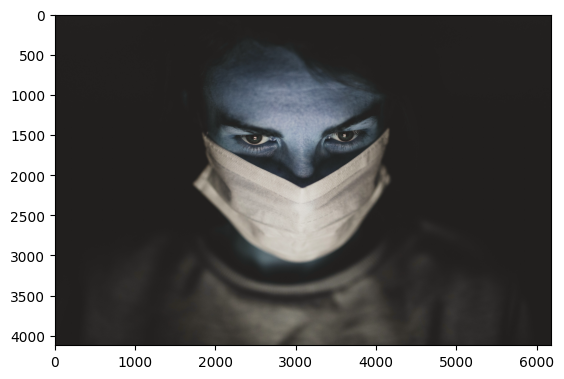

In [ ]:
import cv2
plt.imshow(cv2.imread('/content/test/images/1880.jpg'))

ModuleNotFoundError: No module named 'tensorflow'

In [7]:
import tensorflow as tf
tf.test.is_gpu_available()

ModuleNotFoundError: No module named 'tensorflow'

In [5]:
pwd

'D:\\Anaconda\\envs\\tf-gpu-cuda9'

In [6]:
!conda list

# packages in environment at D:\Anaconda\envs\tf-gpu-cuda9:
#
# Name                    Version                   Build  Channel
_tflow_select             2.3.0                       gpu  
abseil-cpp                20230802.0           h5da7b33_2  
absl-py                   2.1.0            py38haa95532_0  
aiohttp                   3.9.5            py38h2bbff1b_0  
aiosignal                 1.2.0              pyhd3eb1b0_0  
astor                     0.8.1            py38haa95532_0  
astunparse                1.6.3                      py_0  
async-timeout             4.0.3            py38haa95532_0  
attrs                     23.1.0           py38haa95532_0  
blas                      1.0                         mkl  
blinker                   1.6.2            py38haa95532_0  
brotli-python             1.0.9            py38hd77b12b_8  
c-ares                    1.19.1               h2bbff1b_0  
ca-certificates           2024.3.11            haa95532_0  
cachetools                5.3.3

In [8]:
!pip install --ignore-installed --upgrade tensorflow

^C


In [9]:
print("heell")

heell
